# Image Captioning with ViT and GPT2

[Original source code is here](https://github.com/shreydan/VisionGPT2). Link on the [GitHub](https://github.com/shreydan/VisionGPT2).

## Helper functions and libraries

In [1]:
GPU = 0  # GPU number. After change, restart the kernel

%set_env CUDA_VISIBLE_DEVICES={GPU}

import torch

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

if torch.cuda.is_available():  # make sure GPU is available
    num = torch.cuda.device_count()
    print(f"GPU count: {num}")
    for i in range(num):
        print(f"GPU {i} name: {torch.cuda.get_device_name(i)}")
else:
    print("GPU is not available")

env: CUDA_VISIBLE_DEVICES=0
PyTorch version: 2.5.1+cu121
CUDA available: True
GPU count: 1
GPU 0 name: NVIDIA GeForce GTX 1080 Ti


In [2]:
import os
import gc
import math
import json
import random
import requests  # download images using URL
import numpy as np
import pandas as pd
import multiprocessing
import albumentations as alb
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as fn

import timm
import transformers as hf

from PIL import Image
from io import BytesIO
from tqdm.auto import tqdm
from itertools import islice
from types import SimpleNamespace
from albumentations.pytorch import ToTensorV2
from sklearn.model_selection import train_test_split


def set_seed(seed: int = 42):
    """ Set random seed for reproducibility """
    random.seed(seed)
    hf.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True
    torch.backends.cudnn.deterministic = False


set_seed()

CPU = multiprocessing.cpu_count()
NUM_WORKERS = math.ceil(CPU*2/3)
print(f"Number of CPU cores: {CPU}")
print(f"Number of worker cores: {NUM_WORKERS}")

DEVICE = f"cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")
if "cuda" in DEVICE:
    # Get the index of the current CUDA device
    current_device_index = torch.cuda.current_device()
    # Get the name of the current CUDA device
    device_name = torch.cuda.get_device_name(current_device_index)
    print(f"Current CUDA device name: {device_name}")
else:
    print("CUDA is not available. Using CPU")

DECODER = "gpt2"
EPOCHS = 8
BATCH_SIZE = 40

TEMP = "temp"  # path to temporal directory with data
RESULTS = f"{TEMP}/results"  # directory with checkpoints
TRAIN_CSV, VALID_CSV = f"{TEMP}/captions.csv", f"{TEMP}/captions_val.csv"
DS_NAME = f"{TEMP}/flickr8k_huggingface_dataset"
NUM_VALID = 500  # number of validation images in evaluation dataset
MIN_CAPTION_LENGTH = 2  # minimum caption length in chars

os.makedirs(TEMP, exist_ok=True)  # create temporal directory

Number of CPU cores: 12
Number of worker cores: 8
Using device: cuda
Current CUDA device name: NVIDIA GeForce GTX 1080 Ti


## Loading and processing the dataset

In [3]:
# Download and unzip Flickr8k dataset
if os.path.exists(f"{TEMP}/flickr8k"):
    pass  # already downloaded
else:
    URL = "https://github.com/awsaf49/flickr-dataset/releases/download/v1.0/flickr8k.zip"
    !wget -P "{TEMP}" -N "{URL}"
    !unzip -q "{TEMP}/flickr8k.zip" -d "{TEMP}/flickr8k"

In [4]:
df = pd.read_csv(f"{TEMP}/flickr8k/captions.txt")
display(df.head())  # show first rows
print()
for row in islice(df.itertuples(), 12):  # print first 12 rows
    print(row.image, row.caption)

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...



1000268201_693b08cb0e.jpg A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg A girl going into a wooden building .
1000268201_693b08cb0e.jpg A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg A little girl climbing the stairs to her playhouse .
1000268201_693b08cb0e.jpg A little girl in a pink dress going into a wooden cabin .
1001773457_577c3a7d70.jpg A black dog and a spotted dog are fighting
1001773457_577c3a7d70.jpg A black dog and a tri-colored dog playing with each other on the road .
1001773457_577c3a7d70.jpg A black dog and a white dog with brown spots are staring at each other in the street .
1001773457_577c3a7d70.jpg Two dogs of different breeds looking at each other on the road .
1001773457_577c3a7d70.jpg Two dogs on pavement moving toward each other .
1002674143_1b742ab4b8.jpg A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .
1002674143_1b742ab4b8.jpg A little

Skip caption "A" for "temp/flickr8k/Images/2428275562_4bde2bc5ea.jpg"
Skip caption "a" for "temp/flickr8k/Images/3640443200_b8066f37f6.jpg"


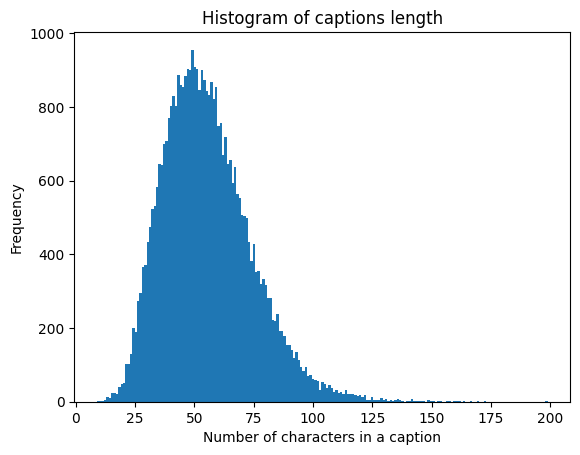


There are 8091 images.

Shortest caption has length 9 for image 'temp/flickr8k/Images/3237760601_5334f3f3b5.jpg':
	a skier .

Longest caption has length 199 for 'temp/flickr8k/Images/2354456107_bf5c766a05.jpg':
	an African-American man wearing a green sweatshirt and blue vest is holding up 2 dollar bills in front of his face , while standing on a busy sidewalk in front of a group of men playing instruments .

There are 7591 training images.
There are 500 validation images.

Show 2 examples from 0 to 2:


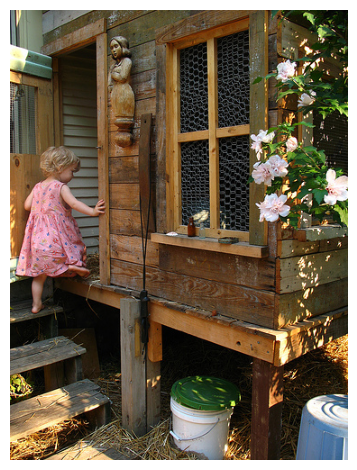

temp/flickr8k/Images/1000268201_693b08cb0e.jpg	
	a child in a pink dress is climbing up a set of stairs in an entry way .
	a girl going into a wooden building .
	a little girl climbing into a wooden playhouse .
	a little girl climbing the stairs to her playhouse .
	a little girl in a pink dress going into a wooden cabin .


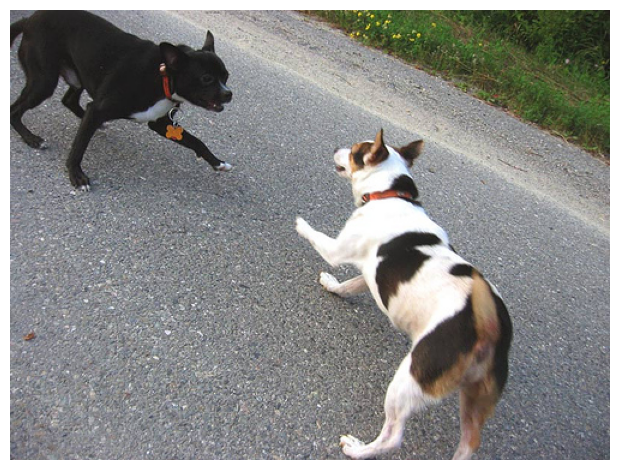

temp/flickr8k/Images/1001773457_577c3a7d70.jpg	
	a black dog and a spotted dog are fighting .
	a black dog and a tri-colored dog playing with each other on the road .
	a black dog and a white dog with brown spots are staring at each other in the street .
	two dogs of different breeds looking at each other on the road .
	two dogs on pavement moving toward each other .

Show 3 examples from 0 to 3:


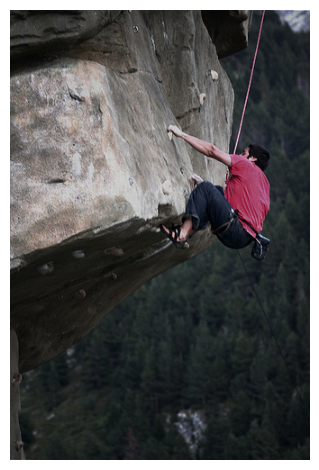

temp/flickr8k/Images/997722733_0cb5439472.jpg	
	a man in a pink shirt climbs a rock face .
	a man is rock climbing high in the air .
	a person in a red shirt climbing up a rock face covered in assist handles .
	a rock climber in a red shirt .
	a rock climber practices on a rock climbing wall .


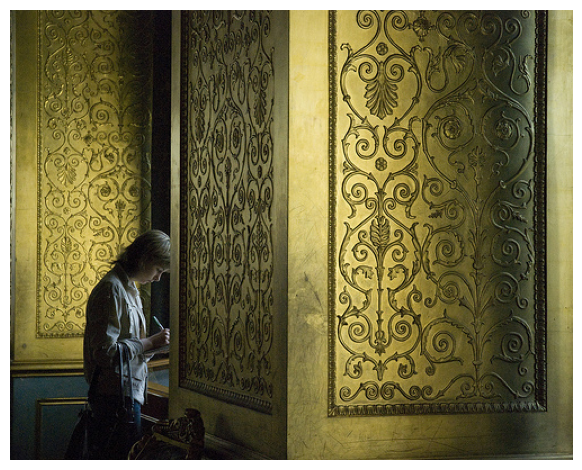

temp/flickr8k/Images/997338199_7343367d7f.jpg	
	a person stands near golden walls .
	a woman behind a scrolled wall is writing .
	a woman standing near a decorated wall writes .
	the walls are covered in gold and patterns .
	woman writing on a pad in room with gold , decorated walls .


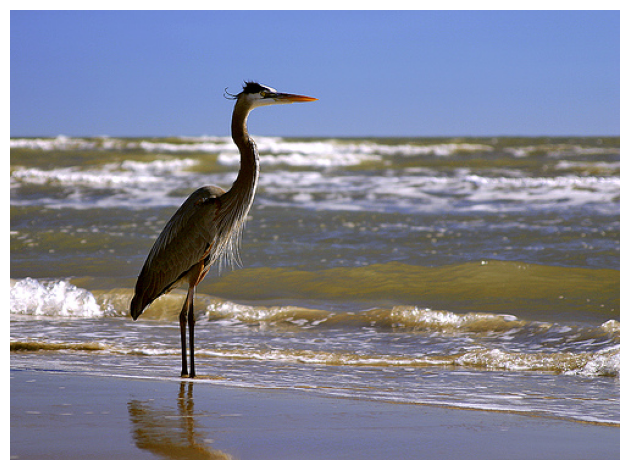

temp/flickr8k/Images/99679241_adc853a5c0.jpg	
	a grey bird stands majestically on a beach while waves roll in .
	a large bird stands in the water on the beach .
	a tall bird is standing on the sand beside the ocean .
	a water bird standing at the ocean 's edge .
	a white crane stands tall as it looks out upon the ocean .



In [5]:
def show(captions, num, start=0):
    """
        Show first `num` key-value pairs in captions.
    """
    print(f"Show {num} examples from {start} to {start + num}:")
    # islice(iterable, start, stop, step)
    iterator = iter(captions.items())
    key_value = islice(iterator, start, start + num)
    for key, value in key_value:
        image = Image.open(key)
        plt.imshow(image)
        plt.axis("off")
        plt.tight_layout()
        plt.show()
        print(f"{key}\t", *value, sep="\n\t")
    print()


def histogram(chars, bins=10):
    """ Create a histogram from a list of integers. """
    plt.hist(chars, bins=bins)  # create the histogram
    # Add labels and a title for clarity
    plt.xlabel("Number of characters in a caption")
    plt.ylabel("Frequency")
    plt.title("Histogram of captions length")
    # Display the plot
    plt.show()


image_path = f"{TEMP}/flickr8k/Images"
captions, captions_val = {}, {}  # training and validation captions

# for row in islice(df.itertuples(), 500):  # test first 500 rows for 100 images
for row in df.itertuples():
    image_name = os.path.join(image_path, row.image)
    caption = row.caption  # copy string

    if len(caption) < MIN_CAPTION_LENGTH:
        print(f'Skip caption "{caption}" for "{image_name}"')
        continue  # skip this caption

    # I don't know why, but from GPT-2 all letters are in lowercase
    # caption = caption[0].upper() + caption[1:]  # capitalize the 1st letter
    caption = caption[0].strip().lower() + caption[1:]  # lowercase the 1st letter

    if caption.endswith((" .", " !", " ?", ' "', )):
        pass  # do nothing
    elif caption.endswith((" ,", " '", )):
        caption = caption[:-2]  # remove the final comma or apostrophe from a caption
        caption = caption + " ."  # add the final period to a caption
    else:
        caption = caption + " ."  # add the final period to a caption
    
    # there are 5 different captions for each image
    if image_name in captions:
        captions[image_name].append(caption)
    else:
        captions[image_name] = [caption]

shortest, longest = None, None  # shortest and longest captions
shortest_len, longest_len = float("inf"), 0
shortest_name, longest_name = None, None
chars = []  # list of captions length

for key, value in captions.items():  # iterate over key-value pairs
    for caption in value:
        caption_len = len(caption)
        chars.append(caption_len)
        if caption_len < shortest_len:
            shortest, shortest_len, shortest_name = caption, caption_len, key
        if caption_len > longest_len:
            longest, longest_len, longest_name = caption, caption_len, key

bins = longest_len - shortest_len + 1
histogram(chars, bins=bins)  # draw histogram of captions length

print(f"\n" f"There are {len(captions)} images.\n")
print(f"Shortest caption has length {shortest_len} for image '{shortest_name}':"
      f"\n\t" f"{shortest}\n")
print(f"Longest caption has length {longest_len} for '{longest_name}':"
      f"\n\t" f"{longest}\n")

for i in range(min(NUM_VALID, len(captions))):
    key, value = captions.popitem()  # removes and returns the last key-value pair
    captions_val[key] = value  # validation captions

print(f"There are {len(captions)} training images.")
print(f"There are {len(captions_val)} validation images.\n")

show(captions, 2)
show(captions_val, 3)

In [6]:
# # ONLY for debug purposes. Making very small dataset
# captions = dict(islice(captions.items(), 300))
# captions_val = dict(islice(captions_val.items(), 300))

In [7]:
def get_pandas_df(captions, csv_file, shuffle=True):
    """
        Convert dictionary back to Pandas dataframe.
        It is OK to have multiple captions per image. It's like text augmentation.
    """
    rows = []
    for key, value in captions.items():
        for caption in value:
            rows.append({"image": key, "caption": caption})

    df = pd.DataFrame(rows)  # from dictionary to Pandas DataFrame
    if shuffle:
        df = df.sample(frac=1).reset_index(drop=True)  # randomly shuffle the rows
    df.to_csv(csv_file, index=False)  # OPTIONAL. Save data to CSV file
    return df


train_df = get_pandas_df(captions, TRAIN_CSV)
valid_df = get_pandas_df(captions_val, VALID_CSV)

## Creating the dataset

`albumentations` is faster than `torchvision`.

In [8]:
augment = alb.Compose([
    alb.HorizontalFlip(p=0.5),

    alb.HueSaturationValue(hue_shift_limit=[-5, 5],
                           sat_shift_limit=[-10, 10],
                           val_shift_limit=[-5, 5],
                           p=0.3,),

    # alb.RGBShift(r_shift_limit=[-5, 5],  # use HueSaturationValue instead
    #              g_shift_limit=[-5, 5],
    #              b_shift_limit=[-5, 5],),

    alb.RandomBrightnessContrast(brightness_limit=[-0.1, 0.1],
                                 contrast_limit=[-0.1, 0.1],
                                 brightness_by_max=True,
                                 ensure_safe_range=False,),

    #alb.ColorJitter(),  # don't use ColorJitter for better color detection

    alb.GaussianBlur(blur_limit=0,
                     sigma_limit=[0, 0.5],),

    alb.GaussNoise(std_range=[0, 0.05],
                   mean_range=[0, 0],
                   per_channel=True,
                   noise_scale_factor=1,),
    
    # use ShiftScaleRotate as alternative to Affine transform
    alb.Affine(scale=[0.9, 1.0],
               translate_percent=[-0.05, 0.05],
               rotate=[-25, 25],
               shear=[-10, 10],
               p=0.5,),

])

valid_tfms = alb.Compose([
    alb.Resize(224, 224),
    alb.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ToTensorV2(),
])

train_tfms = alb.Compose([
    augment,
    valid_tfms,
])

In [9]:
tokenizer = hf.GPT2TokenizerFast.from_pretrained(DECODER)
# in GPT models, the pad tokens are the same as the eos tokens
tokenizer.pad_token = tokenizer.eos_token

print(f"Padding token: {tokenizer.pad_token}")
print(f"End of sentence token: {tokenizer.eos_token}")
print(tokenizer.encode_plus("hello ! this is a test caption ."))

Padding token: <|endoftext|>
End of sentence token: <|endoftext|>
{'input_ids': [31373, 5145, 428, 318, 257, 1332, 8305, 764], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1]}


In [10]:
class Dataset:
    def __init__(self, pandas_df, transforms):
        self.df = pandas_df
        self.tfms = transforms

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        sample = self.df.iloc[idx, :]
        image = sample["image"]
        caption = sample["caption"]
        # process the image
        image = Image.open(image).convert("RGB")
        image = np.array(image)
        image = self.tfms(image=image)
        image = image["image"]
        # every caption ends with the end of sentence token: eos_token (50256 : <|endoftext|>)
        caption = f"{caption}{tokenizer.eos_token}"
        input_ids = tokenizer(caption, truncation=True)["input_ids"]
        # every caption is a sequence of tokens, and as it is causal language modeling where
        # the model predicts the next token, the labels are right shifted by 1 position
        labels = input_ids.copy()
        labels[:-1] = input_ids[1:]  # the labels are right shifted by 1 position
        return image, input_ids, labels

In [11]:
train_ds = Dataset(train_df, train_tfms)
valid_ds = Dataset(valid_df, valid_tfms)

## Custom collate function

* This allows for dynamic data filling, eliminating the need for the model to handle sequences with a maximum length (`max_len`), which would simply be filled with padding tokens.
* Instead, each batch is filled according to the longest sequence in the batch itself.

In [12]:
def collate_fn(batch):
    images = [i[0] for i in batch]
    input_ids = [i[1] for i in batch]
    labels = [i[2] for i in batch]
    images = torch.stack(images, dim=0)
    # every caption is a sequence of tokens
    # every caption ends with the end of sentence token:
    # eos_token (50256 : <|endoftext|>)
    input_ids = tokenizer.pad(
        {"input_ids":input_ids},
        padding="longest",
        return_attention_mask=False,
        return_tensors="pt",
    )["input_ids"]
    # the labels are right shifted by 1 position
    labels = tokenizer.pad(
        {"input_ids":labels},
        padding="longest",
        return_attention_mask=False,
        return_tensors="pt",
    )["input_ids"]
    # in GPT models, the pad tokens are same as the eos tokens,
    # hence we also mask the pad tokens in the labels with -100
    # which are ignored by cross-entropy loss' default behaviour
    mask = (input_ids != tokenizer.pad_token_id).long()
    labels[mask==0] = -100
    return images, input_ids, labels

In [13]:
# Check it
dl = torch.utils.data.DataLoader(
    train_ds,
    shuffle=True,
    batch_size=2,
    collate_fn=collate_fn,
)
_, c, l = next(iter(dl))
print(c[0])
print(l[0])

You're using a GPT2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


tensor([11545,  1450,  4769, 14180,   290,   530, 10846,  4769,   257, 17779,
          764, 50256, 50256, 50256, 50256, 50256])
tensor([ 1450,  4769, 14180,   290,   530, 10846,  4769,   257, 17779,   764,
        50256,  -100,  -100,  -100,  -100,  -100])


## Model

[Model description is by the link](https://www.kaggle.com/code/shreydan/visiongpt2-image-captioning-pytorch?cellIds=21&kernelSessionId=264934616)

Just copy-pasted here the main idea.

![VisionGPT2 image captioning architecture](./data/VisionGPT2_architecture.jpg)

![Detailed architecture of the VisionGPT2 neural network](./data/VisionGPT2Model_architecture.jpg)

   * GPT2 on its own is a **decoder-only model**. So it understands only textual context. To create a model which also understands image context and applies it to the text, we use cross-attention.
   * Cross Attention: It is the second attention layer of the decoder block as per the [classic transformer encoder-decoder model](https://ar5iv.labs.arxiv.org/html/1706.03762).
   * The query in cross-attention is the output of the previous causal attention layer in the decoder block. The key and value are the outputs of the corresponding encoder block i.e. the image context.
   * Since GPT2 doesn't have a cross-attention layer, [The author](https://www.kaggle.com/code/shreydan/visiongpt2-image-captioning-pytorch) ([link2](https://github.com/shreydan/VisionGPT2)) coded it as `GPT2CrossAttention` and made it a part of the usual decoder GPT2Block.
   * The encoder used is ViT-base with patch_size=16 grabbed from timm.
   * ViT and GPT2 are extremely compatible with each other. They have the same amount of depth i.e. encoder, decoder blocks respectively. They have the same hidden size of 768 as well. So you shouldn't have to pool the encoder outputs to match the decoder hidden size.
   * GPT2 code is based on [NanoGPT](https://github.com/karpathy/nanoGPT)


### Causal attention block

In [14]:
class GPT2Attention(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.embed_dim = config.embed_dim
        self.n_heads = config.num_heads
        assert self.embed_dim % self.n_heads == 0, "embedding dimension must be divisible by number of heads"
        self.head_size = self.embed_dim // self.n_heads
        self.seq_len = config.seq_len

        self.c_attn = nn.Linear(self.embed_dim,
                                self.head_size * self.n_heads * 3,
                                bias=True)
        self.scale = self.head_size ** -0.5
        self.register_buffer("mask",
                             torch.tril(torch.ones(1, 1, self.seq_len, self.seq_len)),
                            )
        self.c_proj = nn.Linear(self.embed_dim, self.embed_dim, bias=True)

        self.attn_dropout = nn.Dropout(config.attention_dropout)
        self.resid_dropout = nn.Dropout(config.residual_dropout)


    def forward(self, x):
        b, t, c = x.shape
        # q, k, v shape individually: batch_size * seq_len * embed_dim
        # we know that qk_t = q * k_t, where q = b*t*head_dim, k_t = b*head_dim*t
        q, k, v = self.c_attn(x).chunk(3, dim=-1)
        # batch * n_heads * seq_len * head_dim
        q = q.view(b, t, self.n_heads, self.head_size).permute(0, 2, 1, 3)
        k = k.view(b, t, self.n_heads, self.head_size).permute(0, 2, 1, 3)
        v = v.view(b, t, self.n_heads, self.head_size).permute(0, 2, 1, 3)

        qk_t = (q@k.transpose(-2, -1)) * self.scale
        qk_t = qk_t.masked_fill(
            self.mask[:, :, :t, :t] == 0,
            float("-inf"),
        )
        qk_t = fn.softmax(qk_t, dim=-1)
        weights = self.attn_dropout(qk_t)

        attention = weights @ v  # batch * n_heads * t * head_size
        attention = attention.permute(0, 2, 1, 3).contiguous().view(b, t, c)  # batch*t*embed_dim

        out = self.c_proj(attention)
        out = self.resid_dropout(out)

        return out

### Cross attention block

Notice that parameters are initialized with `mean=0` and `std=0.02`. This is an OpenAI trick they used while training GPT2 as well.

In [15]:
class GPT2CrossAttention(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.embed_dim = config.embed_dim
        self.n_heads = config.num_heads
        assert self.embed_dim % self.n_heads == 0, "embedding dimension must be divisible by number of heads"
        self.head_size = self.embed_dim // self.n_heads
        self.seq_len = config.seq_len

        self.q = nn.Linear(self.embed_dim, self.embed_dim)
        self.k = nn.Linear(self.embed_dim, self.embed_dim)
        self.v = nn.Linear(self.embed_dim, self.embed_dim)
        self.scale = self.head_size ** -0.5

        self.c_proj = nn.Linear(self.embed_dim, self.embed_dim, bias=True)

        self.attn_dropout = nn.Dropout(config.attention_dropout)
        self.resid_dropout = nn.Dropout(config.residual_dropout)

        self.apply(self._init_weights)


    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            # mean=0 and std=0.02 is an OpenAI trick they used while training GPT2
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)
            if module.bias is not None:
                torch.nn.init.zeros_(module.bias)


    def forward(self, q, k, v):
        b, t, c = q.shape

        q = self.q(q)
        k = self.k(k)
        v = self.v(v)

        # batch * n_heads * seq_len * head_dim
        q = q.view(b, q.size(1), self.n_heads, self.head_size).permute(0, 2, 1, 3)
        k = k.view(b, k.size(1), self.n_heads, self.head_size).permute(0, 2, 1, 3)
        v = v.view(b, v.size(1), self.n_heads, self.head_size).permute(0, 2, 1, 3)

        qk_t = (q@k.transpose(-2, -1)) * self.scale
        qk_t = fn.softmax(qk_t, dim=-1)
        weights = self.attn_dropout(qk_t)

        attention = weights @ v  # batch * n_heads * t * head_size
        attention = attention.permute(0, 2, 1, 3).contiguous().view(b, t, c)  # batch*t*embed_dim

        out = self.c_proj(attention)
        out = self.resid_dropout(out)

        return out

### Feed forward block

In [16]:
class GPT2MLP(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.embed_dim = config.embed_dim
        self.mlp_ratio = config.mlp_ratio
        self.mlp_dropout = config.mlp_dropout

        self.c_fc = nn.Linear(self.embed_dim, self.embed_dim * self.mlp_ratio)
        self.act = nn.GELU()
        self.c_proj = nn.Linear(self.embed_dim * self.mlp_ratio, self.embed_dim)
        self.dropout = nn.Dropout(self.mlp_dropout)


    def forward(self, x):
        x = self.c_fc(x)
        x = self.act(x)
        x = self.c_proj(x)
        x = self.dropout(x)
        return x

### Decoder block

Decoder block with added cross-attention and pre-normalization.

In [17]:
class GPT2Block(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.embed_dim = config.embed_dim

        self.ln_1 = nn.LayerNorm(self.embed_dim)
        self.ln_2 = nn.LayerNorm(self.embed_dim)
        self.ln_3 = nn.LayerNorm(self.embed_dim)

        self.attn = GPT2Attention(config)
        self.cross_attn = GPT2CrossAttention(config)
        self.mlp = GPT2MLP(config)


    def forward(self, x, enc_out):
        # Use `x=x+y`. Do not use `x+=y`, because it doesn't work.
        # x+= self.attn(self.ln_1(x))  # it does not work for PyTorch
        x = x + self.attn(self.ln_1(x))
        x = x + self.cross_attn(self.ln_2(x), enc_out, enc_out)
        x = x + self.mlp(self.ln_3(x))
        return x

### The main model


   * Creating ViT model via `timm` library.
   * Added embedding code and right forward pass for the ViT model as per [their code](https://github.com/huggingface/pytorch-image-models/blob/main/timm/models/vision_transformer.py).
   * Each encoder output is passed to the decoder input and to the next encoder input as well. (see the picture)
   * The final decoder outputs are passed through a head block to generate logits as per the vocab size.
   * The loss function is calculated using cross-entropy if labels are present; otherwise, the logits for the last token in the generation sequence are returned.
   * Variable `pretrained_layers_trainable`: freezes/unfreezes ViT and GPT2 pretrained layers.
   * Variable `unfreeze_gpt_layers`: unfreezes GPT2 layers only.
   * Variable `from_pretrained`: loads GPT2 weights via Huggingface GPT2.
   * Variable `generate`: generates caption, sampling via `torch.multinomial` or deterministic via `argmax` with `temperature` control.

In [18]:
class VisionGPT2Model(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.config = config

        vit = timm.create_model("vit_base_patch16_224", pretrained=True, num_classes=0)
        self.patch_embed = vit.patch_embed
        num_patches = self.patch_embed.num_patches

        self.cls_token = vit.cls_token
        embed_len = num_patches + vit.num_prefix_tokens
        self.pos_embed = vit.pos_embed
        self.pos_drop = nn.Dropout(p=0.0)

        self.blocks = nn.ModuleList([vit.blocks[i] for i in range(config.depth)])

        self.transformer = nn.ModuleDict(dict(
            wte = nn.Embedding(config.vocab_size, config.embed_dim),
            wpe = nn.Embedding(config.seq_len, config.embed_dim),
            drop = nn.Dropout(config.emb_dropout),
            h = nn.ModuleList([GPT2Block(config) for _ in range(config.depth)]),
            ln_f = nn.LayerNorm(config.embed_dim),
        ))
        self.lm_head = nn.Linear(config.embed_dim, config.vocab_size, bias=False)
        self.transformer.wte.weight = self.lm_head.weight


    def _pos_embed(self, x):
        x = torch.cat((self.cls_token.expand(x.shape[0], -1, -1), x), dim=1)
        x = x + self.pos_embed
        return self.pos_drop(x)


    def pretrained_layers_trainable(self, trainable=False):
        layers = [
            self.cls_token, self.patch_embed, self.pos_embed, self.blocks,
            self.transformer.wte, self.transformer.wpe,
            self.transformer.ln_f, self.lm_head,
        ]
        gpt_layers = [[
            self.transformer.h[i].ln_1, self.transformer.h[i].ln_2,
            self.transformer.h[i].attn, self.transformer.h[i].mlp,
        ] for i in range(self.config.depth)]
        for l in gpt_layers:
            layers.extend(l)

        for layer in layers:
            if not isinstance(layer, nn.Parameter):
                for p in layer.parameters():
                    p.requires_grad = trainable
            else:
                layer.requires_grad = trainable

        total_frozen_params = sum([p.numel() for p in self.parameters() if not p.requires_grad])
        print(f"{total_frozen_params=}")


    def unfreeze_gpt_layers(self, ):
        gpt_layers = [[
            self.transformer.h[i].ln_1, self.transformer.h[i].ln_2,
            self.transformer.h[i].attn, self.transformer.h[i].mlp,
        ] for i in range(self.config.depth)]
        flatten = []
        for l in gpt_layers:
            flatten.extend(l)

        for layer in flatten:
            if not isinstance(layer, nn.Parameter):
                for p in layer.parameters():
                    p.requires_grad = True
            else:
                layer.requires_grad = True


    @classmethod
    def from_pretrained(self, config):
        model = VisionGPT2Model(config)
        sd = model.state_dict()
        keys = sd.keys()
        ignore_matches = [
            "blocks.", "cross_attn.", "ln_3", "cls_token",
            "pos_embed", "patch_embed.", ".attn.mask",
        ]
        vit_keys = [key for key in keys if any(match in key for match in ignore_matches)]
        gpt_keys = [key for key in keys if key not in vit_keys]

        gpt2_small = hf.GPT2LMHeadModel.from_pretrained("gpt2")
        sd_hf = gpt2_small.state_dict()
        hf_keys = sd_hf.keys()
        hf_keys = [k for k in hf_keys if not k.endswith(".attn.masked_bias")]
        hf_keys = [k for k in hf_keys if not k.endswith(".attn.bias")]
        transposed = ["attn.c_attn.weight", "attn.c_proj.weight",
                      "mlp.c_fc.weight", "mlp.c_proj.weight",]

        for k in hf_keys:
            if any(match in k for match in ignore_matches):
                continue
            if any(k.endswith(w) for w in transposed):
                assert sd_hf[k].shape[::-1] == sd[k].shape
                with torch.no_grad():
                    sd[k].copy_(sd_hf[k].t())
            else:
                assert sd_hf[k].shape == sd[k].shape
                with torch.no_grad():
                    sd[k].copy_(sd_hf[k])

        model.load_state_dict(sd)
        return model


    def forward(self, image, input_ids, labels=None):
        image = self.patch_embed(image)
        image = self._pos_embed(image)

        token_embeddings = self.transformer.wte(input_ids)  # batch * seq_len
        pos_embs = torch.arange(0, input_ids.size(1)).to(input_ids.device)
        positional_embeddings = self.transformer.wpe(pos_embs)
        input_ids = self.transformer.drop(token_embeddings + positional_embeddings)

        for i in range(self.config.depth):
            image = self.blocks[i](image)
            input_ids = self.transformer.h[i](input_ids, image)

        input_ids = self.transformer.ln_f(input_ids)

        if labels is not None:
            lm_logits = self.lm_head(input_ids)
            loss = fn.cross_entropy(lm_logits.view(-1, lm_logits.shape[-1]), labels.view(-1))
            return loss

        lm_logits = self.lm_head(input_ids[:, [-1], :])
        return lm_logits


    def generate(self, image, sequence, max_tokens=50, temperature=1.0, deterministic=False):
        for _ in range(max_tokens):
            out = self(image, sequence)
            out = out[:, -1, :] / temperature
            probs = fn.softmax(out, dim=-1)
            if deterministic:
                next_token = torch.argmax(probs, dim=-1, keepdim=True)
            else:
                next_token = torch.multinomial(probs, num_samples=1)
            sequence = torch.cat([sequence, next_token], dim=1)
            if next_token.item() == tokenizer.eos_token_id:
                break

        return sequence.cpu().flatten()

## Training

   * The pretrained layers are initially frozen, because [author](https://www.kaggle.com/code/shreydan/visiongpt2-image-captioning-pytorch) trains the cross attention layers first.
   * In the following epochs, GPT2 is unfreezed and trained.
   * In the final few epochs, the ViT is unfreezed as well.

<br/>

   * Optimizer: Adam
   * Scheduler: OneCycleLR
   * Mixed-precision fp16 training with autocast and grad-scaler in torch
   * Metrics: cross-entropy loss and perplexity = e^loss, both the lower the better
   * Best model is saved based on validation perplexity and the same is loaded while generating captions

GPT2 generally requires context before generating anything, since for image captioning we can't really provide an initial context except the image itself, the initial context we provide to GPT is just `[50256]` i.e `<|endoftext|>` which is also the beginning of sentence token in GPT. For other models such as OPT it is `</s>`. This one token acts as the initial context.

In [19]:
class Trainer:
    def __init__(self, model_config, train_config, dls):
        self.train_config = train_config
        self.model_config = model_config
        self.device = self.train_config.device

        self.model = VisionGPT2Model.from_pretrained(model_config).to(self.device)
        self.model.pretrained_layers_trainable(trainable=False)

        trainable_parameters = sum([p.numel() for p in self.model.parameters() if p.requires_grad])
        print("trainable parameters:", trainable_parameters)

        self.tokenizer = hf.GPT2TokenizerFast.from_pretrained("gpt2")
        self.tokenizer.pad_token = self.tokenizer.eos_token

        self.scaler = torch.amp.GradScaler(self.device)

        self.train_dl, self.valid_dl = dls

        total_steps = len(self.train_dl)

        self.optim = torch.optim.Adam(self.model.parameters(), lr=self.train_config.lr / 25.0)
        self.sched = torch.optim.lr_scheduler.OneCycleLR(
            self.optim,
            max_lr=self.train_config.lr,
            epochs=self.train_config.epochs,
            steps_per_epoch=total_steps,
        )
        self.batch_losses = list()

        # self.sched = hf.get_linear_schedule_with_warmup(
        #     self.optim,
        #     num_warmup_steps=0,
        #     num_training_steps=total_steps,
        # )

        self.metrics = pd.DataFrame()
        self.metrics[["train_loss", "train_perplexity",
                      "valid_loss", "valid_perplexity",]] = None

        self.gen_tfms = alb.Compose([
            alb.Resize(224, 224),
            alb.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
            ToTensorV2(),
        ])


    def save_model(self, ):
        os.makedirs(self.train_config.model_path, exist_ok=True)
        sd = self.model.state_dict()
        torch.save(sd, f"{self.train_config.model_path}/captioner.pt")


    def load_best_model(self, ):
        sd = torch.load(f"{self.train_config.model_path}/captioner.pt")
        self.model.load_state_dict(sd)


    def train_one_epoch(self,epoch):
        prog = tqdm(self.train_dl, total=len(self.train_dl))
        running_loss = 0.0

        for image, input_ids, labels in prog:
            with torch.autocast(self.device, dtype=torch.float16):
                image = image.to(self.device)
                input_ids = input_ids.to(self.device)
                labels = labels.to(self.device)

                loss = self.model(image, input_ids, labels)

                self.scaler.scale(loss).backward()
                self.scaler.step(self.optim)
                self.scaler.update()
                self.sched.step()
                self.optim.zero_grad(set_to_none=True)

                running_loss += loss.item()
                self.batch_losses.append(loss.item())

                prog.set_description(f"train loss: {loss.item():.3f}")

            # clear memory
            del image, input_ids, labels, loss

        train_loss = running_loss / len(self.train_dl)
        train_pxp = np.exp(train_loss)

        self.metrics.loc[epoch, ["train_loss", "train_perplexity"]] = (train_loss, train_pxp)


    @torch.no_grad()
    def valid_one_epoch(self, epoch):
        prog = tqdm(self.valid_dl, total=len(self.valid_dl))
        running_loss = 0.0

        for image, input_ids, labels in prog:
            with torch.autocast(self.device):
                image = image.to(self.device)
                input_ids = input_ids.to(self.device)
                labels = labels.to(self.device)

                loss = self.model(image,input_ids,labels)
                running_loss += loss.item()

                prog.set_description(f"valid loss: {loss.item():.3f}")

            # clear memory
            del image, input_ids, labels, loss

        valid_loss = running_loss / len(self.valid_dl)
        valid_pxp = np.exp(valid_loss)

        self.metrics.loc[epoch, ["valid_loss", "valid_perplexity"]] = (valid_loss, valid_pxp)
        return valid_pxp


    def clean(self):
        gc.collect()
        torch.cuda.empty_cache()


    def fit(self,):
        best_pxp = 1e9
        best_epoch = -1
        prog = tqdm(range(self.train_config.epochs))

        for epoch in prog:
            if epoch == self.train_config.freeze_epochs_gpt:
                self.model.unfreeze_gpt_layers()
                print("unfreezing GPT2 entirely...")

            if epoch == self.train_config.freeze_epochs_all:
                self.model.pretrained_layers_trainable(trainable=True)
                print("unfreezing ViT and GPT2 pretrained layers...")

            self.model.train()
            prog.set_description("training")
            self.train_one_epoch(epoch)
            self.clean()

            self.model.eval()
            prog.set_description("validating")
            pxp = self.valid_one_epoch(epoch)
            self.clean()

            print(self.metrics.tail(1))

            if pxp < best_pxp:
                best_pxp = pxp
                best_epoch = epoch
                print("saving best model...")
                self.save_model()

        return {
            "best_perplexity": best_pxp,
            "best_epoch": best_epoch,
        }


    @torch.no_grad()
    def generate_caption(self, image, max_tokens=50, temperature=1.0, deterministic=False):
        self.model.eval()
        if image.startswith("https://"):  # download from the Internet
            response = requests.get(image)
            image = BytesIO(response.content)
        image = Image.open(image).convert("RGB")
        image = np.array(image)
        image = self.gen_tfms(image=image)["image"]
        image = image.unsqueeze(0).to(self.device)
        sequence = torch.ones(1, 1).to(device=self.device).long() * self.tokenizer.bos_token_id

        caption = self.model.generate(
            image,
            sequence,
            max_tokens=max_tokens,
            temperature=temperature,
            deterministic=deterministic,
        )
        caption = self.tokenizer.decode(caption.numpy(), skip_special_tokens=True)

        return caption

In [20]:
model_config = SimpleNamespace(
    vocab_size = 50_257,
    embed_dim = 768,
    num_heads = 12,
    seq_len = 1024,
    depth = 12,
    attention_dropout = 0.1,
    residual_dropout = 0.1,
    mlp_ratio = 4,
    mlp_dropout = 0.1,
    emb_dropout = 0.1,
)

# 23 epochs in total
# (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15) --> first 16 epochs to train GPT2 attention blocks only
# (16,17,18,19,20) --> unfreeze GPT2 and train for +5 epochs
# (21,22) --> unfreeze ViT and train all weights for +2 epochs
train_config = SimpleNamespace(
    epochs = 23,
    freeze_epochs_gpt = 16,
    freeze_epochs_all = 21,
    lr = 1e-4,
    device = DEVICE,
    model_path = os.path.join("temp", "captioner"),
    batch_size = 32,
)

train_dl = torch.utils.data.DataLoader(
    train_ds,
    batch_size=train_config.batch_size,
    shuffle=True,
    pin_memory=True,
    num_workers=NUM_WORKERS,
    persistent_workers=True,
    collate_fn=collate_fn,
)

valid_dl = torch.utils.data.DataLoader(
    valid_ds,
    batch_size=train_config.batch_size,
    shuffle=False,
    pin_memory=True,
    num_workers=NUM_WORKERS,
    persistent_workers=True,
    collate_fn=collate_fn,
)

trainer = Trainer(model_config, train_config, (train_dl, valid_dl))

total_frozen_params=210236928
trainable parameters: 28366848


In [21]:
os.environ["TOKENIZERS_PARALLELISM"] = "false"  # remove multiple warnings (or "true")

# # If a previous model exists, load it.
# model_path = f"{train_config.model_path}/captioner.pt"
# if os.path.isfile(model_path):
#     print(f"Load previous model from '{model_path}'")
#     trainer.load_best_model()

trainer.fit()

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  train_loss train_perplexity valid_loss valid_perplexity
0   6.634736       761.078169   5.631046       278.953774
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  train_loss train_perplexity valid_loss valid_perplexity
1   5.451798       233.177152   4.669778       106.674107
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  train_loss train_perplexity valid_loss valid_perplexity
2   4.216632        67.804725   3.660048         38.86319
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  train_loss train_perplexity valid_loss valid_perplexity
3   3.594086        36.382421   3.237263        25.463925
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  train_loss train_perplexity valid_loss valid_perplexity
4   3.264343        26.162926   3.018779        20.466291
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  train_loss train_perplexity valid_loss valid_perplexity
5   3.050853        21.133354   2.867727        17.596974
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  train_loss train_perplexity valid_loss valid_perplexity
6   2.902084        18.212055   2.765218        15.882508
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  train_loss train_perplexity valid_loss valid_perplexity
7   2.787188        16.235305   2.676972        14.540994
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  train_loss train_perplexity valid_loss valid_perplexity
8   2.692401        14.767084   2.625244        13.807945
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

  train_loss train_perplexity valid_loss valid_perplexity
9   2.614232        13.656728   2.581135        13.212124
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
10   2.540075        12.680616   2.543709        12.726786
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
11   2.477025        11.905793   2.516205        12.381514
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
12   2.420677        11.253477   2.485885        12.011749
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
13   2.373114        10.730753   2.472125        11.847602
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
14   2.330044        10.278393    2.45564        11.653884
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
15   2.288138         9.856567   2.451185        11.602085
saving best model...
unfreezing GPT2 entirely...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
16   2.234668         9.343381   2.378398        10.787603
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
17   2.125317         8.375553   2.342977        10.412185
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
18   2.051957          7.78312   2.326303        10.240017
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
19   2.001334         7.398921   2.313393        10.108662
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
20   1.971029         7.178061   2.311369        10.088224
saving best model...
total_frozen_params=0
unfreezing ViT and GPT2 pretrained layers...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
21   1.937521          6.94152   2.301689         9.991045
saving best model...


  0%|          | 0/1187 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

   train_loss train_perplexity valid_loss valid_perplexity
22   1.903771         6.711151   2.302467         9.998817


{'best_perplexity': np.float64(9.991045376059574), 'best_epoch': 21}

## Results
Validation loss for 8,000 images of Flickr8k is **2.30**.

Validation loss for 330,000 images of MS-COCO [is **2.09**](https://github.com/shreydan/VisionGPT2?tab=readme-ov-file#results).

In [22]:
trainer.metrics

,train_loss,train_perplexity,valid_loss,valid_perplexity
0,6.634736,761.078169,5.631046,278.953774
1,5.451798,233.177152,4.669778,106.674107
2,4.216632,67.804725,3.660048,38.86319
3,3.594086,36.382421,3.237263,25.463925
4,3.264343,26.162926,3.018779,20.466291
5,3.050853,21.133354,2.867727,17.596974
6,2.902084,18.212055,2.765218,15.882508
7,2.787188,16.235305,2.676972,14.540994
8,2.692401,14.767084,2.625244,13.807945
9,2.614232,13.656728,2.581135,13.212124


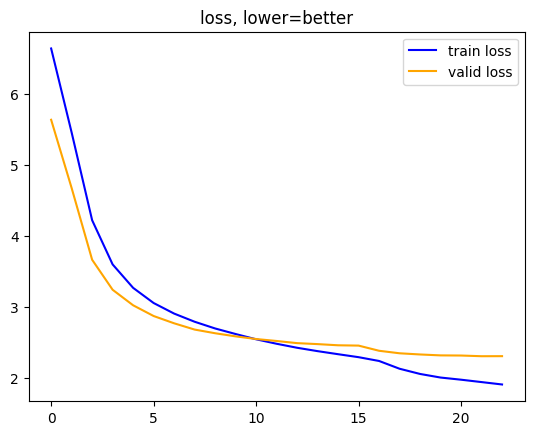

In [23]:
plt.plot(trainer.metrics["train_loss"], color="blue",   label="train loss")
plt.plot(trainer.metrics["valid_loss"], color="orange", label="valid loss")
plt.title("loss, lower=better")
plt.legend()
plt.show()

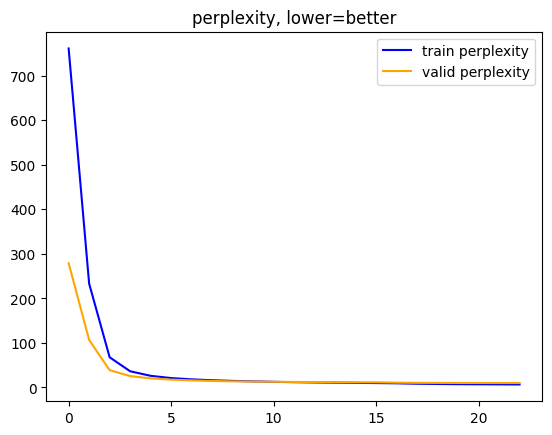

In [24]:
plt.plot(trainer.metrics["train_perplexity"], color="blue",   label="train perplexity")
plt.plot(trainer.metrics["valid_perplexity"], color="orange", label="valid perplexity")
plt.title("perplexity, lower=better")
plt.legend()
plt.show()

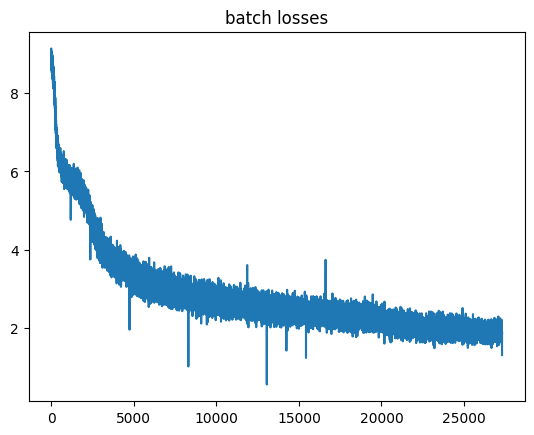

In [25]:
plt.plot(trainer.batch_losses)
plt.title("batch losses")
plt.show()

## Predictions

In [26]:
trainer.load_best_model()

/tmp/ipykernel_1684754/2667758403.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sd = torch.load(f"{self.train_config.model_path}/captioner.pt")


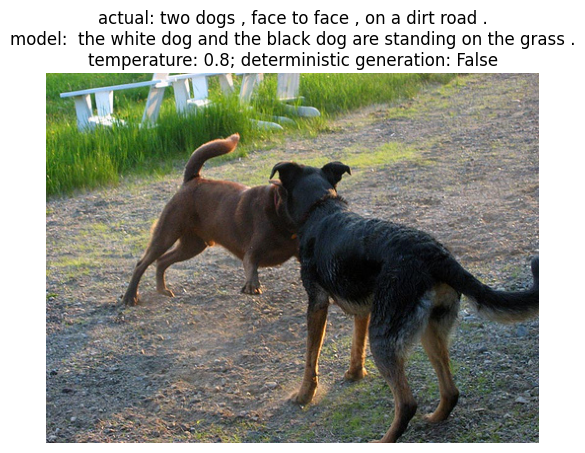

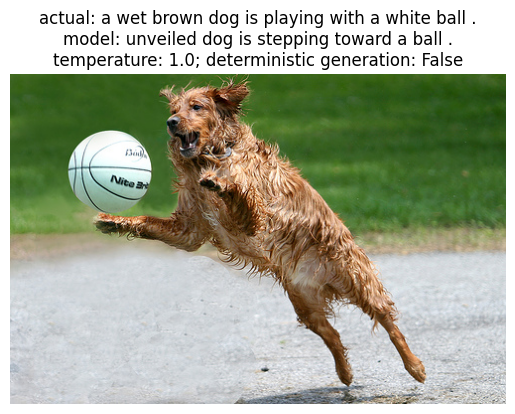

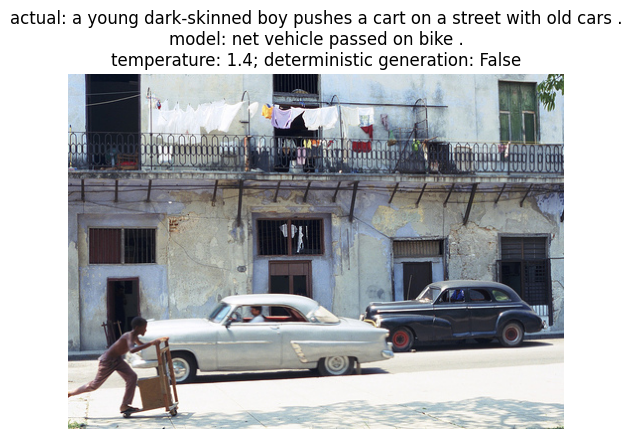

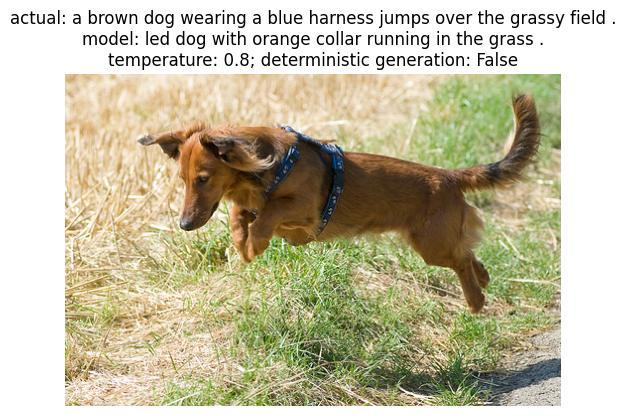

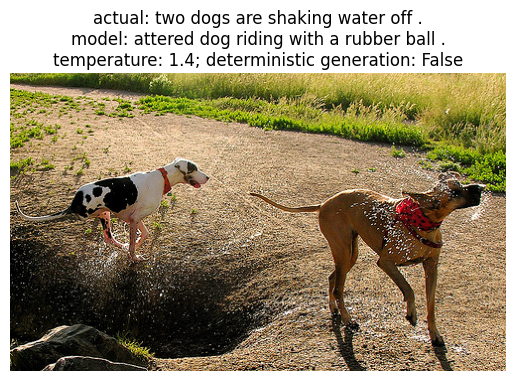

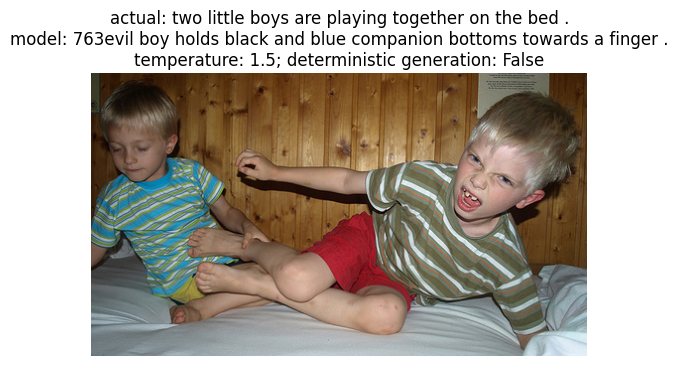

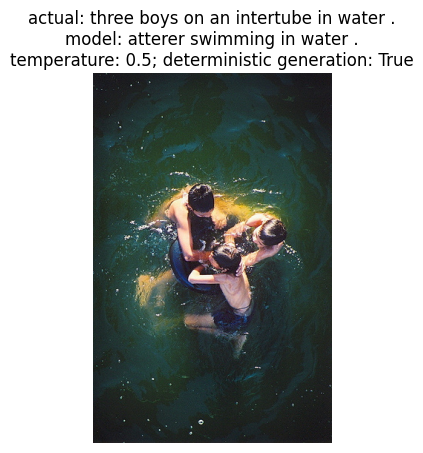

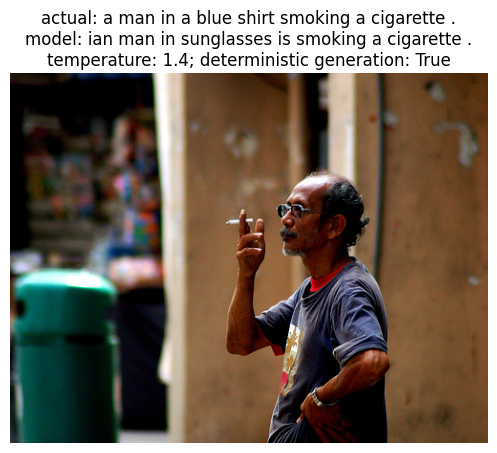

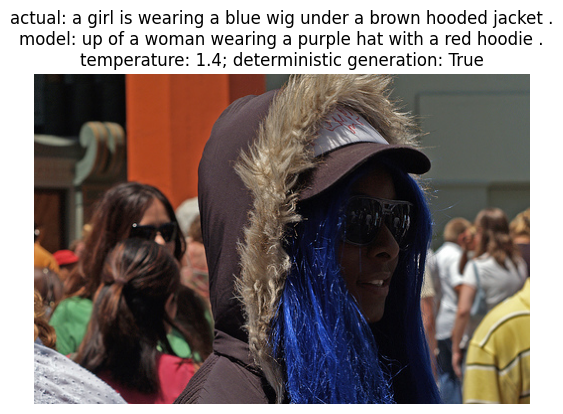

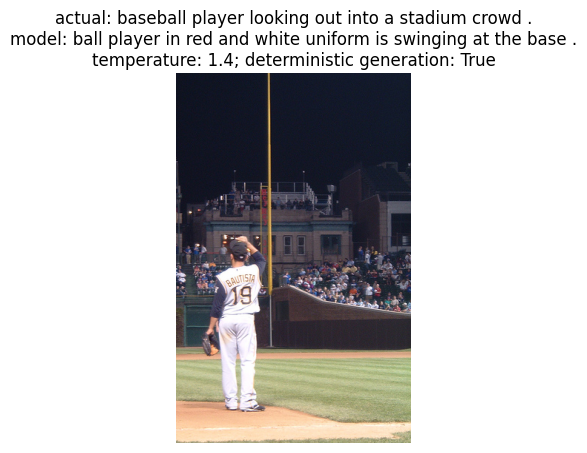

In [27]:
num = 10
for i in range(num):
    deterministic = False
    test = valid_df.sample(n=1).values[0]
    test_img, test_caption = test[0], test[1]
    plt.imshow(Image.open(test_img).convert("RGB"))
    temperature = np.random.uniform(0.5, 1.5)  # random temperature
    if i > num / 2:
        deterministic = True
    gen_caption = trainer.generate_caption(
        test_img, temperature=temperature, deterministic=deterministic)
    plt.title(f"actual: {test_caption}\n"
              f"model: {gen_caption}\n"
              f"temperature: {temperature:.1f}; deterministic generation: {deterministic}")
    plt.axis("off")
    plt.show()

In [28]:
def get_key_value(captions, num):
    """ Get key-value pair from the dictionary """
    iterator = iter(captions.items())
    key_value = next(islice(iterator, num, num + 1), None)
    return key_value


def predict_captions(trainer, path, num_answers=5, num_answers_det=2):
    """ Helper function for getting image captions from the Internet or from a file path """
    if path.startswith("https://"):  # download from the Internet
        response = requests.get(path)
        img = Image.open(BytesIO(response.content))
    else:  # from the file path
        img = Image.open(path)

    display(img)

    t1, t2 = 0.5, 1.5  # temperatures
    t_step = (t2 - t1) / (num_answers - 1)  # 1.0/4 = 0.25
    t_list = []  # list of temperatures
    for i in range(num_answers):
        t_list.append(t1 + i * t_step)

    preds = []  # predictions of the model
    for t in t_list:
        det = False
        gen_caption = trainer.generate_caption(path, temperature=t, deterministic=det)
        preds.append(f"t={t:.2f}; det={det}\t{gen_caption}")

    for _ in range(num_answers_det):
        t = np.random.uniform(0.5, 1.5)  # random temperature
        det = True
        gen_caption = trainer.generate_caption(path, temperature=t, deterministic=det)
        preds.append(f"t={t:.2f}; det={det}\t{gen_caption}")

    print(f"\nPredicted captions:\t", *preds, sep="\n\t")

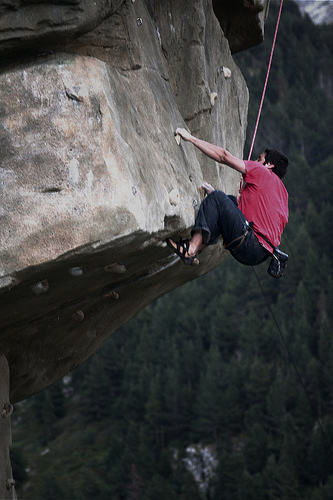


Predicted captions:	
	t=0.50; det=False	now climber climbing .
	t=0.75; det=False	guy rock climbing .
	t=1.00; det=False	guy is rock climbing .
	t=1.25; det=False	top rock climber climbs from t-shirt .
	t=1.50; det=False	iker shifting shoulders to accept the view on rock ledge as monitor .
	t=1.19; det=True	now climber in red shirt climbing .
	t=1.29; det=True	now climber in red shirt climbing .

Ground truth captions:	
	a man in a pink shirt climbs a rock face .
	a man is rock climbing high in the air .
	a person in a red shirt climbing up a rock face covered in assist handles .
	a rock climber in a red shirt .
	a rock climber practices on a rock climbing wall .


In [29]:
img_path, actual_captions = get_key_value(captions_val, 0)
predict_captions(trainer, img_path)
print("\nGround truth captions:\t", *actual_captions, sep="\n\t")

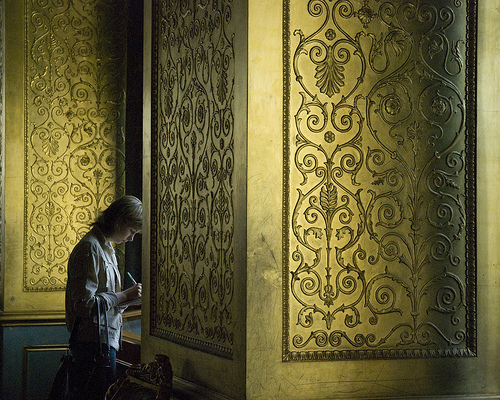


Predicted captions:	
	t=0.50; det=False	uitless man in a white suit is standing in front of a white building with a large painting on the wall .
	t=0.75; det=False	 an adult looking through a stained window .
	t=1.00; det=False	shirting woman painting on stained canvas and painting on wall .
	t=1.25; det=False	itianchened woman peeking inside a few wooden benches .
	t=1.50; det=False	oven otgmention depicts Bouldering refugees stretching their hand up .
	t=1.43; det=True	 a man in a black shirt is standing in front of a large window .
	t=1.27; det=True	 a man in a black shirt is standing in front of a large window .

Ground truth captions:	
	a person stands near golden walls .
	a woman behind a scrolled wall is writing .
	a woman standing near a decorated wall writes .
	the walls are covered in gold and patterns .
	woman writing on a pad in room with gold , decorated walls .


In [30]:
img_path, actual_captions = get_key_value(captions_val, 1)
predict_captions(trainer, img_path)
print("\nGround truth captions:\t", *actual_captions, sep="\n\t")

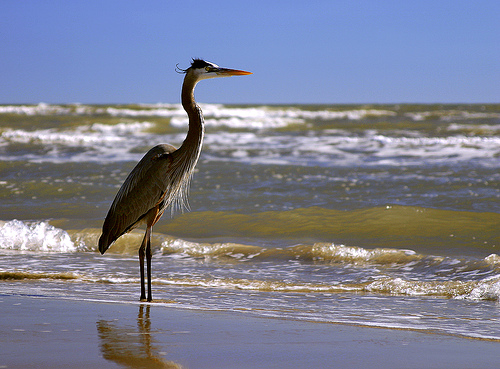


Predicted captions:	
	t=0.50; det=False	 bird flying over the water .
	t=0.75; det=False	bird flying through water .
	t=1.00; det=False	looked , bird bounds through water .
	t=1.25; det=False	ey looking bird near beach , with location in the water .
	t=1.50; det=False	 all ready rides along jet-surflips on emerging ocean lines on small birdsionee .
	t=0.59; det=True	 bird flying over water .
	t=0.73; det=True	 bird flying over water .

Ground truth captions:	
	a grey bird stands majestically on a beach while waves roll in .
	a large bird stands in the water on the beach .
	a tall bird is standing on the sand beside the ocean .
	a water bird standing at the ocean 's edge .
	a white crane stands tall as it looks out upon the ocean .


In [31]:
img_path, actual_captions = get_key_value(captions_val, 2)
predict_captions(trainer, img_path)
print("\nGround truth captions:\t", *actual_captions, sep="\n\t")

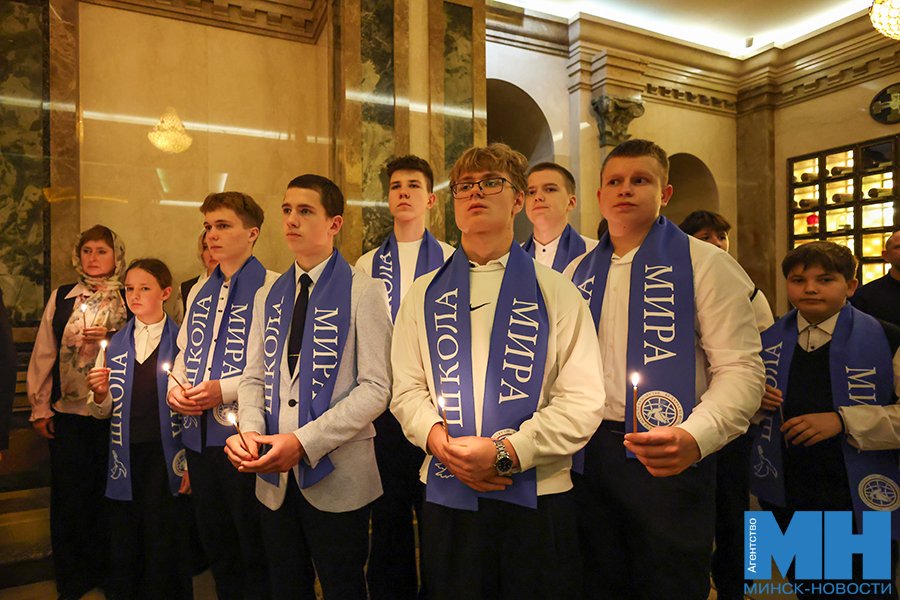


Predicted captions:	
	t=0.50; det=False	roup of men and women in white shirts and jackets , holding black and white balloons .
	t=0.75; det=False	ouple playing outside .
	t=1.00; det=False	resents , children and a man sit in front of the window .
	t=1.25; det=False	oppers speak into formal ceremony .
	t=1.50; det=False	count breakdown Instructions ass  over beer glasses his project limedo dancereering this books handwriting .
	t=1.00; det=True	rowd of people in a line .
	t=0.51; det=True	rowd of people in a line .


In [32]:
path = "https://minsknews.by/wp-content/uploads/2025/10/120a8130-kopiya.jpg"
predict_captions(trainer, path)

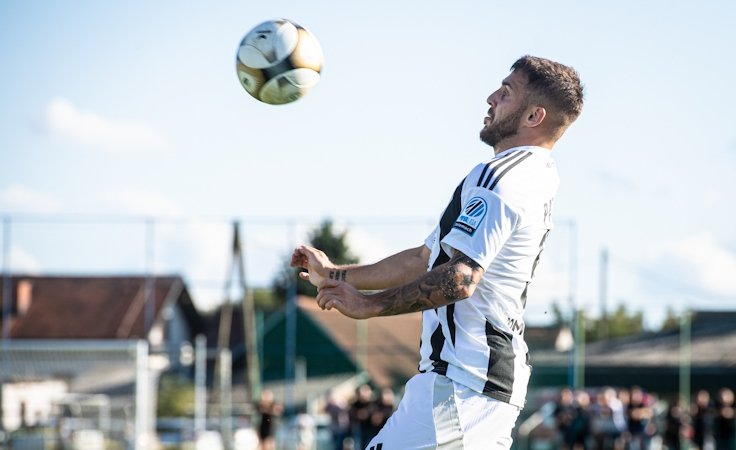


Predicted captions:	
	t=0.50; det=False	by soccer player in a black and white uniform is about to kick the ball .
	t=0.75; det=False	up of a soccer player , with a soccer ball in his hands , jumping .
	t=1.00; det=False	ie shooting a soccer ball towards the man with a green colored jersey .
	t=1.25; det=False	iting stars after a faint fog foggy day .
	t=1.50; det=False	 two adults played soccer , tagged with soccer ball .
	t=1.12; det=True	by picture of a soccer player in a white jersey and blue and white shorts .
	t=1.16; det=True	by picture of a soccer player in a white jersey and blue and white shorts .


In [33]:
path = "https://football.by/storage/images/post_img/1759599441.jpg"
predict_captions(trainer, path)

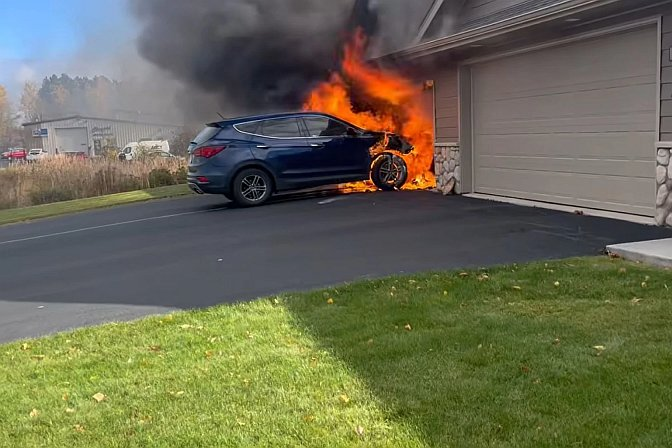


Predicted captions:	
	t=0.50; det=False	 a car and a car are coming out of the garage .
	t=0.75; det=False	 fire is coming out of a house .
	t=1.00; det=False	 an empty car coming out of a firepoke .
	t=1.25; det=False	opheelle running out of the front gate .
	t=1.50; det=False	neck building with a large than 88 car on curb approaching from the burn Her house leaving OST building sticking smoke running a door hood .
	t=1.20; det=True	 fire is coming out of the house .
	t=1.06; det=True	 fire is coming out of the house .


In [34]:
path = "https://raw.githubusercontent.com/foobar167/junkyard/refs/heads/master/fine_tuning/data/test_image_02.jpg"
predict_captions(trainer, path)

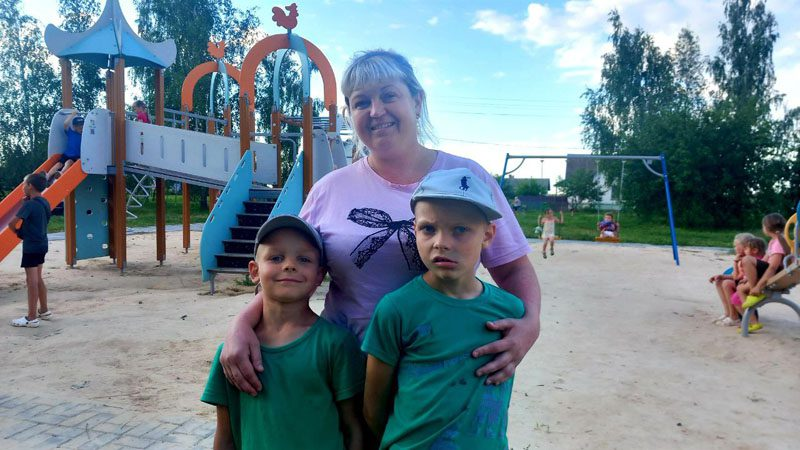


Predicted captions:	
	t=0.50; det=False	-up girl poses with two children in a park .
	t=0.75; det=False	hounds are playing on a playground .
	t=1.00; det=False	ults around a child wearing a green shirt and carrying overgrown children nearby a playground .
	t=1.25; det=False	iking female as two children posing together playing in the park .
	t=1.50; det=False	rough Glen Underpass girls end the slide four arms in front of a pool .
	t=0.95; det=True	-up girl in blue shirt and a boy in blue shirt pose for a picture .
	t=1.36; det=True	-up girl in blue shirt and a boy in blue shirt pose for a picture .


In [35]:
path = "https://raw.githubusercontent.com/foobar167/junkyard/refs/heads/master/fine_tuning/data/test_image_03.jpg"
predict_captions(trainer, path)

In [ ]:
# %%script echo "Skip this cell"

# Clean up resources. Place this code at the end of the program
import os, signal
os.kill(os.getpid(), signal.SIGTERM)  # you can use signal.SIGKILL for Linux, but not for Windows

## Conclusions

   * 7,591 training images are not enough to generate all possible captions for all possible images. However, the results are quite respectable.
   * Datasets for image captioning:
      * **Flickr8k** dataset has 8,091 image-text examples (5 pairs for each example). Links: [GitHub](https://github.com/awsaf49/flickr-dataset), [Kaggle](https://www.kaggle.com/datasets/adityajn105/flickr8k), [PyTorch](https://docs.pytorch.org/vision/main/generated/torchvision.datasets.Flickr8k.html#torchvision.datasets.Flickr8k), [Huggingface](https://huggingface.co/datasets/jxie/flickr8k).
      * **Flickr30k** dataset consists of 30,000 images that are each paired with 5 different captions. Links: [Huggingface](https://huggingface.co/datasets/nlphuji/flickr30k), [GitHub](https://github.com/awsaf49/flickr-dataset), [Kaggle](https://www.kaggle.com/datasets/adityajn105/flickr30k).
      * **MS-COCO** dataset consists of 330,000 images that are each paired with 5 different captions. Links: [Huggingface](https://huggingface.co/datasets/HuggingFaceM4/COCO), [Kaggle](https://www.kaggle.com/datasets/nikhil7280/coco-image-caption), [Homepage](https://cocodataset.org/#home).
   * As [the author said](https://www.kaggle.com/code/shreydan/visiongpt2-image-captioning-pytorch?scriptVersionId=264934616&cellId=46): "The generations are good not great, can definitely train for a lot longer for better results".
   * Additional decoding strategies like beam (*what is it?*), [contrastive learning](https://colab.research.google.com/drive/18ZOGcDPDfYbrXjeixPr_OYj7-D_sjIHp#scrollTo=I1dVlNR25Wal) could've been implemented.
   * All of this can be done using HuggingFace VisionEncoderDecoderModel and their Seq2SeqTrainer, here's a [tutorial](https://ankur3107.github.io/blogs/the-illustrated-image-captioning-using-transformers/). **I personally can not replicate the results from this tutorial**. Perhaps more effort is needed, or a mistake was made somewhere.